In [1]:
# In this approach we have used VAR model 

In [1]:
# -*- coding: utf-8 -*-
"""
Use Case 2: Build a Time Series Forecast Model for Inventory Management

author: RK
"""

import pandas as pd
import numpy as np
import os
import random
from pandas.plotting import register_matplotlib_converters
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
register_matplotlib_converters()

from statsmodels.tsa.vector_ar.var_model import VAR

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

import warnings

In [2]:
#import data , header argument takes care of filling the column headers
df = pd.read_excel('C:/Users/rahul.kondhalkar/Downloads/technicaltestfromjet2traveltechnologies/Usecase2_Dataset.xlsx', header=[0,1,2]) 
#set part number to index
#

df.columns = df.columns.map('{0[0]}{0[1]}{0[2]}'.format)

df=df.groupby(['Unnamed: 0_level_0Unnamed: 0_level_1Part No']).sum() # Aggeregate redundant Parts
#df.head()


# take transpose, easy to work with
df = df.T

# use datetime for index
xx = pd.date_range(start='1/1/2016', periods=177, freq='W')
df = df.set_index(xx)

df = df.apply(pd.to_numeric, errors='coerce')
df = df.fillna(0)

df.head()


Unnamed: 0_level_0Unnamed: 0_level_1Part No,18345617,18345618,19316005,19316006,29032395,29032396,29032407,29032408,29032411,29032412,...,32054388EG,32054389EG,A005H177,A005H178,A005Y137,A005Y138,A008A576,A008A576EG,A008A578,A008A578EG
2016-01-03,0,0,0,0,24,24,200,200,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-10,0,0,0,0,214,210,692,692,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-17,0,0,0,0,162,162,864,868,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-24,0,0,0,0,30,34,764,765,100,100,...,0,0,0,0,0,0,0,0,0,0
2016-01-31,0,0,0,0,60,60,784,784,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
### ADJUST AND CLEAN DATA ###

df_external = pd.DataFrame(df.index)

for col in df.columns:
    
    if df[col].dtype == object: # correct type
        df[col] = pd.to_numeric(df[col].str.replace(',', '.'))
    
    df[col] = df[col].replace(-200, np.nan) # check nans
    print(col, ':', df[col].isna().sum()/len(df))
    if df[col][:int(len(df)*0.8)].isna().sum()/int(len(df)*0.8) > 0.5: # at least 50% in train not nan
        df.drop(col, axis=1, inplace=True)
    else:
        df[col] = df[col].interpolate(method='linear', limit_direction='both') # fill nans
        
   

18345617 : 0.0
18345618 : 0.0
19316005 : 0.0
19316006 : 0.0
29032395 : 0.0
29032396 : 0.0
29032407 : 0.0
29032408 : 0.0
29032411 : 0.0
29032412 : 0.0
29032413 : 0.0
29032414 : 0.0
29032423 : 0.0
29032424 : 0.0
29032485 : 0.0
29032486 : 0.0
29032487 : 0.0
29032488 : 0.0
29032507 : 0.0
29032508 : 0.0
29032627 : 0.0
29032628 : 0.0
29032635 : 0.0
29032636 : 0.0
29032639 : 0.0
29032640 : 0.0
29032648 : 0.0
29032649 : 0.0
29032671 : 0.0
29032723 : 0.0
29032724 : 0.0
29032728 : 0.0
29032729 : 0.0
29032751 : 0.0
29032752 : 0.0
29032775 : 0.0
29032776 : 0.0
29032787 : 0.0
29032788 : 0.0
29032793 : 0.0
29032794 : 0.0
29032797 : 0.0
29032798 : 0.0
29032802 : 0.0
29032803 : 0.0
29032808 : 0.0
29032809 : 0.0
29032814 : 0.0
29032815 : 0.0
29032822 : 0.0
29032823 : 0.0
29032841 : 0.0
29032842 : 0.0
29032874 : 0.0
29032875 : 0.0
29032892 : 0.0
29032893 : 0.0
29032900 : 0.0
29032901 : 0.0
29032912 : 0.0
29032913 : 0.0
29032920 : 0.0
29032921 : 0.0
29032935 : 0.0
29032936 : 0.0
29032977 : 0.0
29032978 :

In [4]:

### ADJUST AND CLEAN DATA ###

df_external = pd.DataFrame(df.index)
df_external.columns=['date']      
df_external.head()
date = df_external['date'].values


In [6]:
### PLOTTING UTILITY FUNCTIONS ###

def plot_sensor(name):
    
    plt.figure(figsize=(16,4))

    plt.plot(train_date, train[name], label='train')
    plt.plot(test_date, test[name], label='test')
    plt.ylabel(name); plt.legend()
    plt.show()
    
def plot_autocor(name, df):
    
    plt.figure(figsize=(16,4))
    
    # pd.plotting.autocorrelation_plot(df[name])
    # plt.title(name)
    # plt.show()
    
    timeLags = np.arange(1,100*24)
    plt.plot([df[name].autocorr(dt) for dt in timeLags])
    plt.title(name); plt.ylabel('autocorr'); plt.xlabel('time lags')
    plt.show()

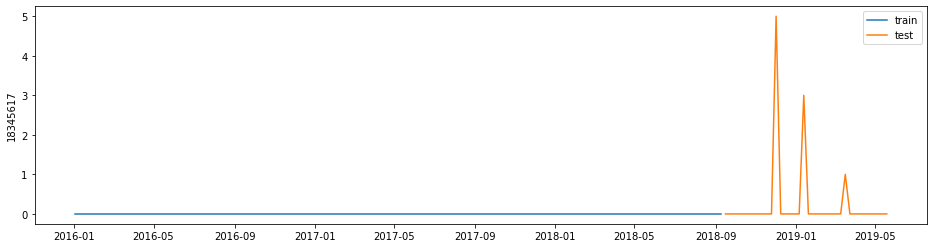

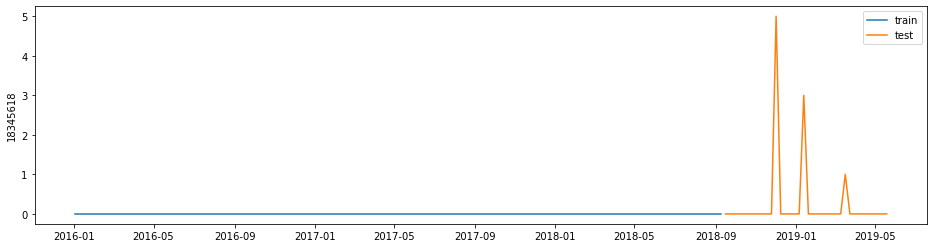

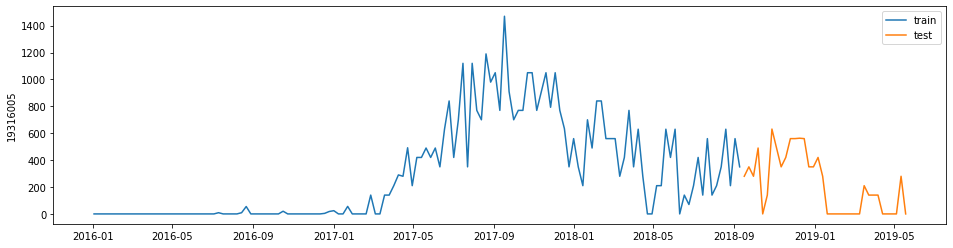

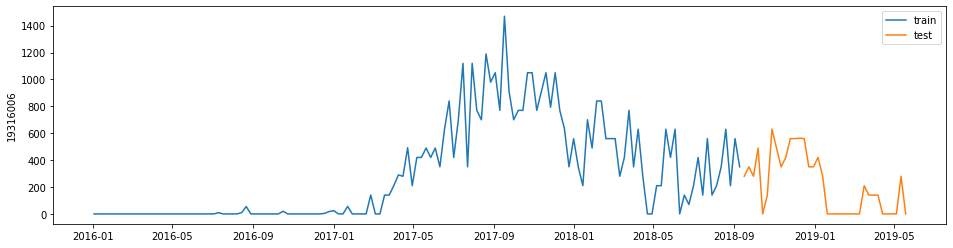

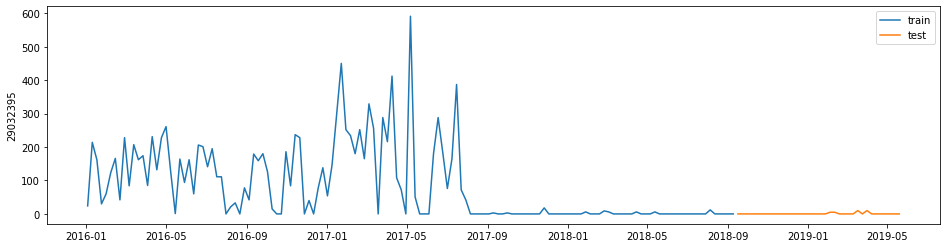

...

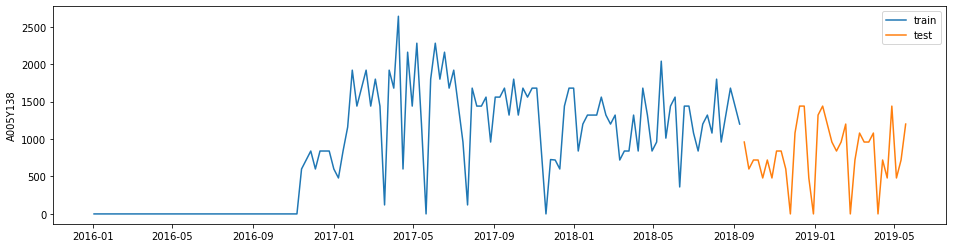

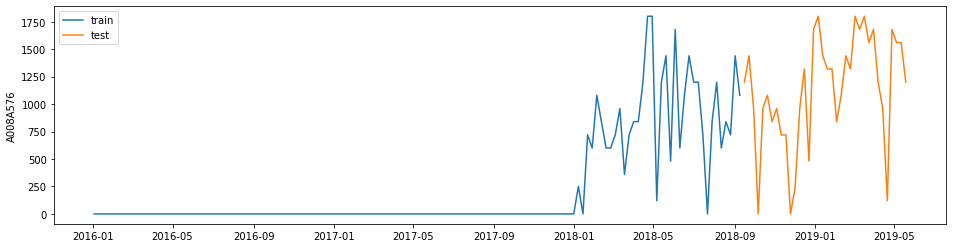

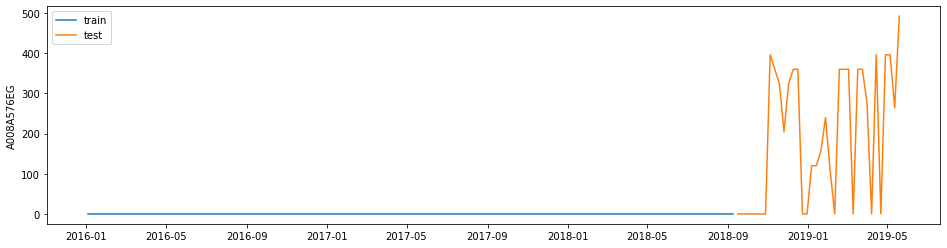

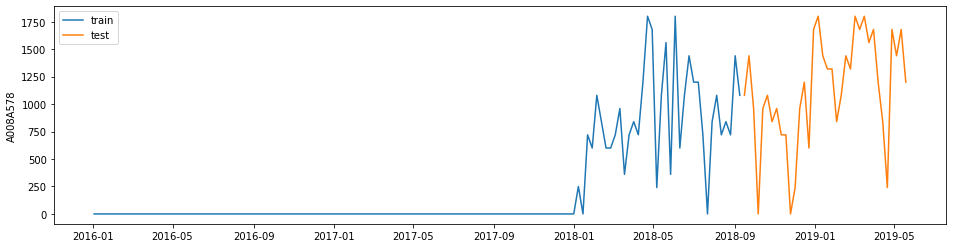

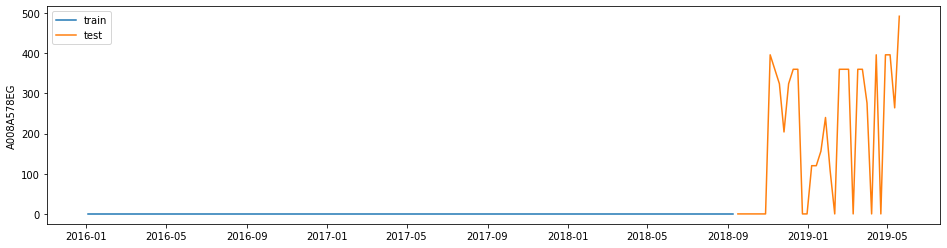

In [7]:
### PLOT ORIGINAL SERIES ###

for col in df.columns:
    plot_sensor(col)

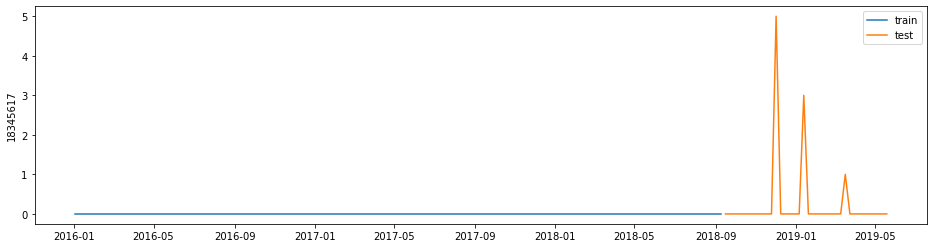

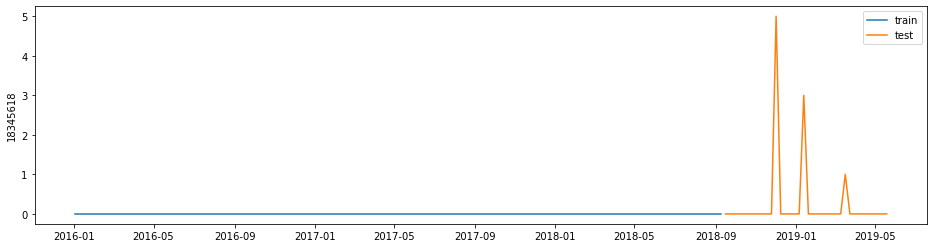

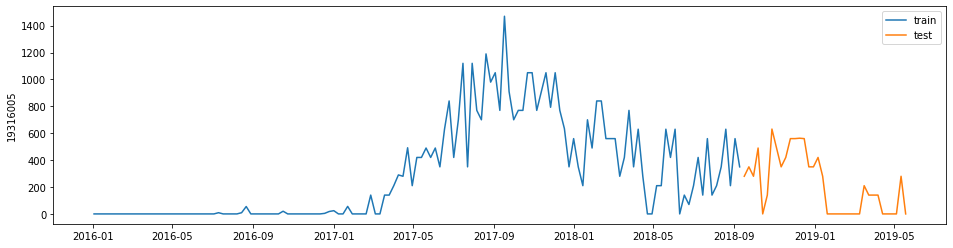

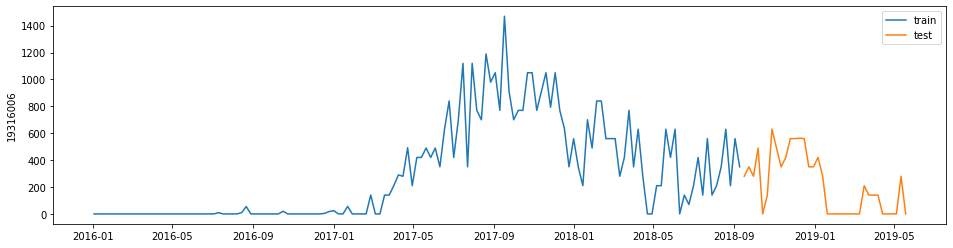

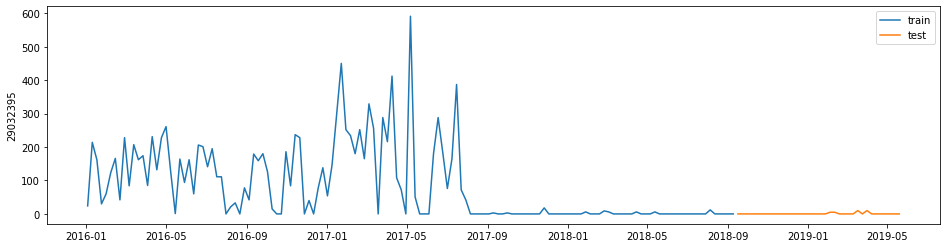

...

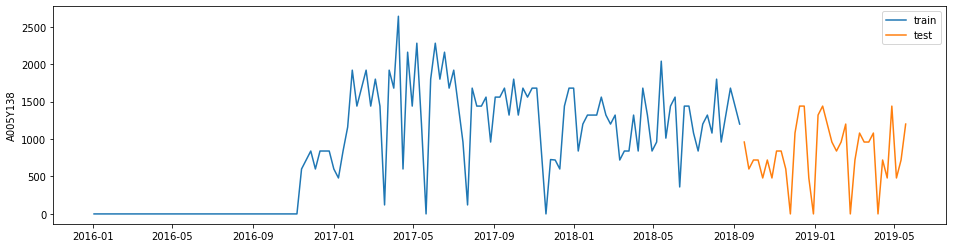

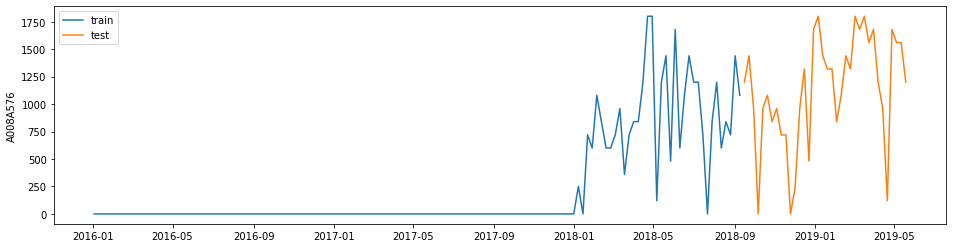

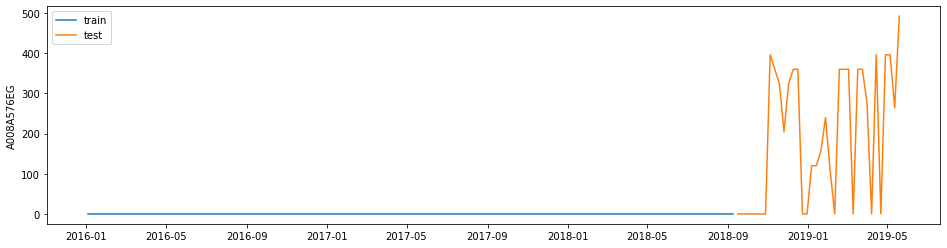

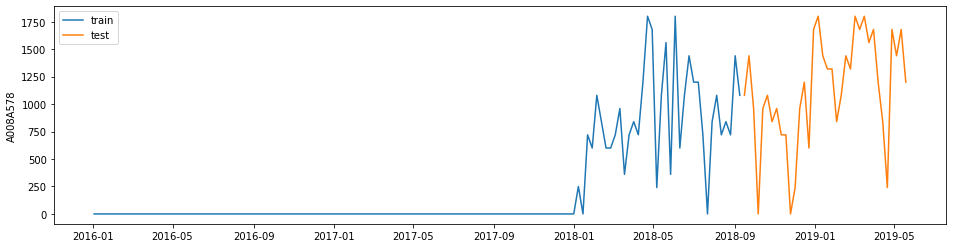

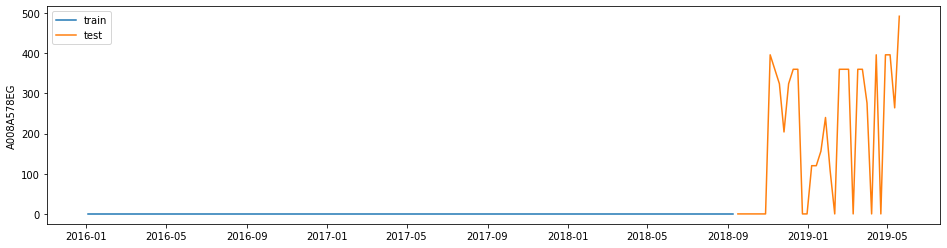

In [8]:
### PLOT ORIGINAL SERIES ###

for col in df.columns:
    plot_sensor(col)

In [ ]:
## Based on the series plot we have observed that
# 1. There are few parts listed below whose sales started from late 2018 or early 2019
# 2. Few parts whose sales stopped after certain period
# 3. Few parts whose sales are not regular

# we have listed those parts and removed from the research
#18345617, 18345618,29032395,2902396,29032407,29032408,29032411,29032412,29032485,29032486,29032487,29032488,29032648,29032649,
# 29032671,29032728,29032729,29032775,29032776,29032797,29032798,29032808,29032809,29032892,29032893,29032920,29032921,29032935,
# 29032936,29032977,29032978,29033007,29033008,29033019,29033020,29033023,29033024,29033064,29033065,29033093,29033094,29033095,29033096,
# 29033101,29033102,29033110,29033111,29033127,29033128,29033129,29033130,29033143,29033148,29033149,29033203,29033204,29033214,29033215,
# 29033216,29033217,29033228,29033229,29033234,29033235,29033236,29033237,29033238,29033239,29033244,29033245,29033246,29033247,
# 29033252,29033253,29033254,29033255,29033256,29033257,29033258,29033259,29033265,29033266,29033267,29033268,29033274,29033275,
# 29033277,29033278,29033295,29033296,29033319,29033320,29033332,29033333,29033340,29033341,29033354,29033355,29932157,29932158,
# 29932159,29932160,29932222,32054032,32054033,32054388,32054389,67033499,67033500,"29032138BC","29032139BC","29032295DR","29032296DR",
# "2903247DP","29032428DP","29032587DL","29032588DL","29032615DL","29032616DL","29032651DF","29032652DF","29033234PB","29033235PB",
# "32042191FR","32042192FR","32054388EG","32054389EG","A005H177","A005H178","A008A576","A008A576EG","A008A578","A008A576EG"


In [9]:
# As a sample taken below four parts and performed time series Analysis using VAR
df1=df.reset_index()
df1.columns.values[0]='date'
df1=df1[['date',29032423,29032413,'29032342FI','29032526DL']]

In [10]:
#Testing hypothesis
from statsmodels.tsa.vector_ar.vecm import coint_johansen

johan_test_temp = df1.drop(['date'],axis=1)
coint_johansen(johan_test_temp,-1,1).eig

#All the eigen values are less than 1: Therefore VAR can be applied

array([0.46947116, 0.21692435, 0.07400436, 0.00844871])

In [11]:
#Spliting data into train and test
df1 = df1.set_index(list(df1)[0])
train = df1[:int(0.8*(len(df1)))]
test = df1[int(0.8*(len(df1))):]
train.head()

Unnamed: 0_level_0Unnamed: 0_level_1Part No,29032423,29032413,29032342FI,29032526DL
date,,,,
2016-01-03,32,50,240,0
2016-01-10,144,96,480,360
2016-01-17,216,296,240,1305
2016-01-24,216,272,1440,1485
2016-01-31,64,128,720,1125


In [32]:
# Understand the size of train and test data
print(train.shape)
print(test.shape)

(141, 4)
(36, 4)


In [12]:
### FIND BEST VAR ORDER ###

AIC = {}
best_aic, best_order = np.inf, 0

for i in range(1,20):
    model = VAR(endog=train.values)
    model_result = model.fit(maxlags=i)
    AIC[i] = model_result.aic
    
    if AIC[i] < best_aic:
        best_aic = AIC[i]
        best_order = i
        
print('BEST ORDER', best_order, 'BEST AIC:', best_aic)

BEST ORDER 2 BEST AIC: 45.66331328111417


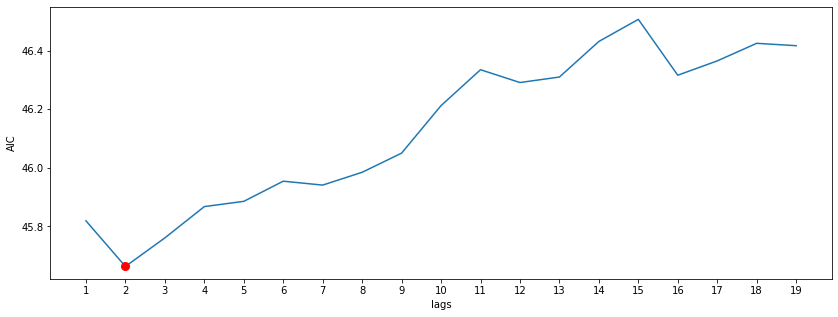

In [30]:
### PLOT AICs ### 

plt.figure(figsize=(14,5))
plt.plot(range(len(AIC)), list(AIC.values()))
plt.plot([best_order-1], [best_aic], marker='o', markersize=8, color="red")
plt.xticks(range(len(AIC)), range(1,50))
plt.xlabel('lags'); plt.ylabel('AIC')
np.set_printoptions(False)

In [13]:
### FIT FINAL VAR WITH LAG CORRESPONTING TO THE BEST AIC ###

var = VAR(endog=train.values)
var_result = var.fit(maxlags=best_order)
var_result.aic

45.66331328111417

In [14]:
### UTILITY FUNCTION FOR RETRIVE VAR PREDICTIONS ###

def retrive_prediction(prior, prior_init, steps):
    
    pred = var_result.forecast(np.asarray(prior), steps=steps)
    init = prior_init.tail(period).values
    
    if steps > period:
        id_period = list(range(period))*(steps//period)
        id_period = id_period + list(range(steps-len(id_period)))
    else:
        id_period = list(range(steps))
    
    final_pred = np.zeros((steps, prior.shape[1]))
    for j, (i,p) in enumerate(zip(id_period, pred)):
        final_pred[j] = init[i]+p
        init[i] = init[i]+p    
        
    return final_pred

In [15]:
### RETRIVE PREDICTION AND OBTAIN THE CORRESPONDING ACTUAL VALUES ###

period = 1
date = '2018-01-07T00:00:00.000000000'
forward = 36
date_range = pd.date_range(date, periods=forward+1, freq='W', closed='right')

final_pred = retrive_prediction(df1.loc[:date], df1.loc[:date], steps = forward)
final_true = df1.loc[date_range]

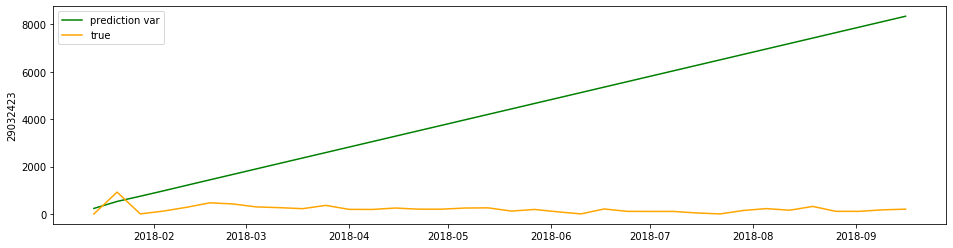

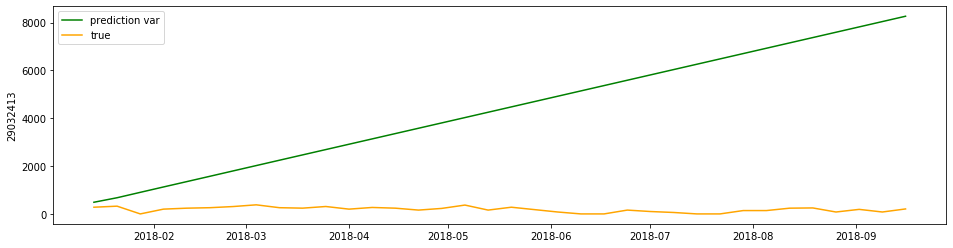

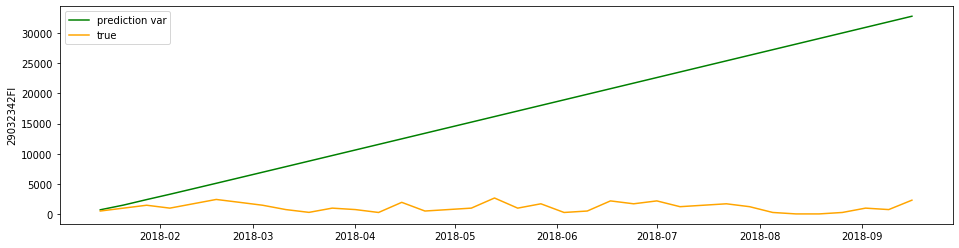

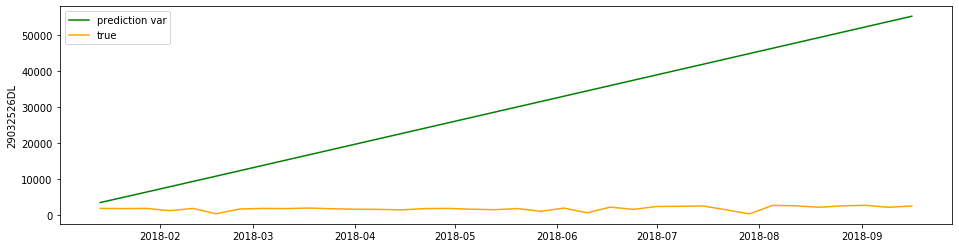

In [16]:
### PLOT ACTUAL vs PREDICTION ###

for i,col in enumerate(df1.columns):

    plt.figure(figsize=(16,4))
    plt.plot(date_range, final_pred[:,i], c='green', label='prediction var')
    plt.plot(date_range, final_true[col].values, c='orange', label='true')
    plt.ylabel(col); plt.legend()
    plt.show()

In [ ]:
# To further improve the accuracy we can use LSTM model